In [105]:
import pandas as pd
import numpy as np
import urllib.request, json, bs4 as bs, requests
import folium
import seaborn as sns
import matplotlib.pyplot
import json
import re
import os
from sklearn.preprocessing import Imputer
from sklearn.linear_model import LinearRegression
from scipy import stats
import statsmodels.api as sm
import ast
from branca.colormap import linear

In [106]:
os.listdir("./")

['aggregating_demographic_data.ipynb',
 'SouthernCaliforniaCountyAnalysis.ipynb',
 'food_diversity_report.ipynb',
 'process_restaurant_data.ipynb',
 'detailed_restaurant_data_san_francisco_to_sonoma.json',
 'voting_data.csv',
 'data_exploration.ipynb',
 '.DS_Store',
 'detailed_restaurant_data_imperial_to_merced.json',
 'final_restaurant_data.csv',
 'ethnicityData2010.csv',
 'foursquare_geospatial_data.ipynb',
 'detailed_restaurant_data_san_stanislaus_to_yuba.json',
 'Income_data_cleaning.ipynb',
 'race_data.xls',
 'Project_Plan.pages',
 'full_county_data.csv',
 'output.png',
 'detailed_restaurant_data_mono_to_san_diego.json',
 'basic_restaurant_data.json',
 'voting_data_cleaning.ipynb',
 '.ipynb_checkpoints',
 'detailed_restaurant_data_alameda_to_humboldt.json',
 'density_and_uniqueness.png',
 'detailed_restaurant_data_modoc.json',
 'county_income_data.csv',
 'basic_county_data.csv']

# Merging all Restarant Data

In [107]:
with open('basic_restaurant_data.json') as f:
    basic_county_json = json.load(f)
    
with open('detailed_restaurant_data_alameda_to_humboldt.json') as f:
    alameda_humboldt = json.load(f)    
    
with open('detailed_restaurant_data_imperial_to_merced.json') as f:
    imperial_merced = json.load(f)   
    
with open('detailed_restaurant_data_modoc.json') as f:
    modoc = json.load(f)   
    
with open('detailed_restaurant_data_mono_to_san_diego.json') as f:
    mono_san_diego = json.load(f)
  
with open('detailed_restaurant_data_san_francisco_to_sonoma.json') as f:
    san_francisco_sonoma = json.load(f)

with open('detailed_restaurant_data_san_stanislaus_to_yuba.json') as f:
    stanislaus_yuba = json.load(f)   

ethnicity_data_2010 = pd.read_csv("ethnicityData2010.csv")
    
ethnicity_data_2010 =ethnicity_data_2010.loc[ethnicity_data_2010['CountyName']!= "California",:].reset_index()

geojson_url = "http://s3-us-west-2.amazonaws.com/boundaries.latimes.com/archive/1.0/boundary-set/counties-2012.geojson"
response = urllib.request.urlopen(geojson_url)
california_geo = json.loads(response.read().decode())

counties = [california_geo['features'][i]['properties']['name'] for i in range(58)]


In [108]:
basic_county_json.keys()

dict_keys(['Alameda', 'Alpine', 'Amador', 'Butte', 'Calaveras', 'Colusa', 'Contra Costa', 'Del Norte', 'El Dorado', 'Fresno', 'Glenn', 'Humboldt', 'Imperial', 'Inyo', 'Kern', 'Kings', 'Lake', 'Lassen', 'Los Angeles', 'Madera', 'Marin', 'Mariposa', 'Mendocino', 'Merced', 'Modoc', 'Mono', 'Monterey', 'Napa', 'Nevada', 'Orange', 'Placer', 'Plumas', 'Riverside', 'Sacramento', 'San Benito', 'San Bernardino', 'San Diego', 'San Francisco', 'San Joaquin', 'San Luis Obispo', 'San Mateo', 'Santa Barbara', 'Santa Clara', 'Santa Cruz', 'Shasta', 'Sierra', 'Siskiyou', 'Solano', 'Sonoma', 'Stanislaus', 'Sutter', 'Tehama', 'Trinity', 'Tulare', 'Tuolumne', 'Ventura', 'Yolo', 'Yuba'])

In [109]:
def basic_data_parser(basic_county_json):
    
    basic_county_parsed = {'county':[],'restaurant':[],'id':[],'lat':[],'lng':[],
                          'city':[], 'category name':[],'category plural name':[]
                          ,'category short name':[]}

    for county in basic_county_json.keys():

        for restaurant in basic_county_json[county].keys():

            basic_county_parsed['county'].append(county)

            basic_county_parsed['restaurant'].append(restaurant)

            basic_county_parsed['id'].append(basic_county_json[county]
                                                 [restaurant]['id'])

            basic_county_parsed['lat'].append(basic_county_json[county]
                                                 [restaurant]['loc']['lat'])
            
            basic_county_parsed['lng'].append(basic_county_json[county]
                                                 [restaurant]['loc']['lng'])
            
            try: 
            
                basic_county_parsed['city'].append(basic_county_json[county]
                                                 [restaurant]['loc']['city'])
            except: 
                basic_county_parsed['city'].append(None)
                

            basic_county_parsed['category name'].append(basic_county_json[county]
                                                 [restaurant]['cat'][0]['name'])
            
            basic_county_parsed['category plural name'].append(basic_county_json[county]
                                                 [restaurant]['cat'][0]['pluralName'])
            
            basic_county_parsed['category short name'].append(basic_county_json[county]
                                                 [restaurant]['cat'][0]['shortName'])
    
    final_county_data = pd.DataFrame(basic_county_parsed, columns = basic_county_parsed.keys())
    
    return(final_county_data)



In [110]:
basic_restaurant_data = basic_data_parser(basic_county_json)
basic_restaurant_data.head()

,county,restaurant,id,lat,lng,city,category name,category plural name,category short name
0,Alameda,Peet's Coffee & Tea,49c0397bf964a52055551fe3,37.841617,-122.293626,Emeryville,Coffee Shop,Coffee Shops,Coffee Shop
1,Alameda,Drake's Dealership,55a6eee8498e39b5dd60f45a,37.812825,-122.266742,Oakland,Beer Garden,Beer Gardens,Beer Garden
2,Alameda,Nyum Bai,5a8b2bf691eaca3c3cb196cc,37.776183,-122.224315,Oakland,Cambodian Restaurant,Cambodian Restaurants,Cambodian
3,Alameda,Shan Dong,4a22d464f964a520927d1fe3,37.800500,-122.270046,Oakland,Chinese Restaurant,Chinese Restaurants,Chinese
4,Alameda,Xolo,4d8982c1b799a35d13059863,37.808422,-122.269730,Oakland,Mexican Restaurant,Mexican Restaurants,Mexican


In [111]:


def detailed_data_parser(detailed_county_json):
    
    detailed_county_parsed = {'county':[],'restaurant':[],'id':[],'price':[],'rating':[]}

    for county in detailed_county_json.keys():

        for restaurant in detailed_county_json[county].keys():

            detailed_county_parsed['county'].append(county)

            detailed_county_parsed['restaurant'].append(restaurant)

            detailed_county_parsed['id'].append(detailed_county_json[county]
                                                 [restaurant]['id'])

            detailed_county_parsed['price'].append(detailed_county_json[county]
                                                 [restaurant]['price'])

            detailed_county_parsed['rating'].append(detailed_county_json[county]
                                                 [restaurant]['rating'])
    
    final_county_data = pd.DataFrame(detailed_county_parsed, columns = ['county',
                                                                         'restaurant',
                                                                         'id',
                                                                         'price',
                                                                         'rating'])
    
    return(final_county_data)


        
    






In [112]:
alameda_humboldt_parsed = detailed_data_parser(alameda_humboldt)
imperial_merced_parsed = detailed_data_parser(imperial_merced)
modoc_parsed = detailed_data_parser(modoc) 
mono_san_diego_parsed = detailed_data_parser(mono_san_diego)
san_francisco_sonoma_parsed = detailed_data_parser(san_francisco_sonoma)
stanislaus_yuba_parsed = detailed_data_parser(stanislaus_yuba)

In [113]:
detailed_data_in_list = [alameda_humboldt_parsed,imperial_merced_parsed,modoc_parsed,
                        mono_san_diego_parsed,san_francisco_sonoma_parsed,stanislaus_yuba_parsed]

In [114]:
detailed_data_all_counties = pd.concat(detailed_data_in_list)

In [115]:
merged_restaurant_data = basic_restaurant_data.merge(detailed_data_all_counties)

In [116]:
merged_restaurant_data.head()

,county,restaurant,id,lat,lng,city,category name,category plural name,category short name,price,rating
0,Alameda,Peet's Coffee & Tea,49c0397bf964a52055551fe3,37.841617,-122.293626,Emeryville,Coffee Shop,Coffee Shops,Coffee Shop,"{'tier': 2, 'message': 'Moderate', 'currency':...",7.9
1,Alameda,Drake's Dealership,55a6eee8498e39b5dd60f45a,37.812825,-122.266742,Oakland,Beer Garden,Beer Gardens,Beer Garden,"{'tier': 2, 'message': 'Moderate', 'currency':...",9.4
2,Alameda,Nyum Bai,5a8b2bf691eaca3c3cb196cc,37.776183,-122.224315,Oakland,Cambodian Restaurant,Cambodian Restaurants,Cambodian,None,8.9
3,Alameda,Shan Dong,4a22d464f964a520927d1fe3,37.800500,-122.270046,Oakland,Chinese Restaurant,Chinese Restaurants,Chinese,"{'tier': 2, 'message': 'Moderate', 'currency':...",9.0
4,Alameda,Xolo,4d8982c1b799a35d13059863,37.808422,-122.269730,Oakland,Mexican Restaurant,Mexican Restaurants,Mexican,"{'tier': 2, 'message': 'Moderate', 'currency':...",8.5


In [117]:
# merged_restaurant_data.to_csv('final_restaurant_data.csv')

# Merging Restaurant Data With Census and Demographic Data

In [118]:
final_restaurant_data = pd.read_csv('final_restaurant_data.csv')
county_census_and_demographic_data = pd.read_csv('full_county_data.csv')

In [119]:
county_and_restaurant_data = final_restaurant_data.merge(county_census_and_demographic_data)
price_gradings = []


for i in range(county_and_restaurant_data.shape[0]):
    
    try:

        price_gradings.append(ast.literal_eval(county_and_restaurant_data['price'][i])['message'])
    except: 
        
        price_gradings.append(None)
        
county_and_restaurant_data = county_and_restaurant_data.assign(price_grade = price_gradings).iloc[:,1:]
        


county_and_restaurant_data.head()

,county,restaurant,id,lat,lng,city,category name,category plural name,category short name,price,...,County Seat,Land Area (km2),Land Area (mi2),Water Area (km2),Water Area (mi2),Total Area (km2),Total Area (mi2),centroid_latitude,centroid_longitude,price_grade
0,Alameda,Peet's Coffee & Tea,49c0397bf964a52055551fe3,37.841617,-122.293626,Emeryville,Coffee Shop,Coffee Shops,Coffee Shop,"{'tier': 2, 'message': 'Moderate', 'currency':...",...,Oakland,1914.046,739.017,213.185,82.311,2127.231,821.328,37.648081,-121.913304,Moderate
1,Alameda,Drake's Dealership,55a6eee8498e39b5dd60f45a,37.812825,-122.266742,Oakland,Beer Garden,Beer Gardens,Beer Garden,"{'tier': 2, 'message': 'Moderate', 'currency':...",...,Oakland,1914.046,739.017,213.185,82.311,2127.231,821.328,37.648081,-121.913304,Moderate
2,Alameda,Nyum Bai,5a8b2bf691eaca3c3cb196cc,37.776183,-122.224315,Oakland,Cambodian Restaurant,Cambodian Restaurants,Cambodian,NaN,...,Oakland,1914.046,739.017,213.185,82.311,2127.231,821.328,37.648081,-121.913304,None
3,Alameda,Shan Dong,4a22d464f964a520927d1fe3,37.800500,-122.270046,Oakland,Chinese Restaurant,Chinese Restaurants,Chinese,"{'tier': 2, 'message': 'Moderate', 'currency':...",...,Oakland,1914.046,739.017,213.185,82.311,2127.231,821.328,37.648081,-121.913304,Moderate
4,Alameda,Xolo,4d8982c1b799a35d13059863,37.808422,-122.269730,Oakland,Mexican Restaurant,Mexican Restaurants,Mexican,"{'tier': 2, 'message': 'Moderate', 'currency':...",...,Oakland,1914.046,739.017,213.185,82.311,2127.231,821.328,37.648081,-121.913304,Moderate


In [120]:
raw_counts = county_and_restaurant_data['category name'].value_counts()

proportions = raw_counts/raw_counts.sum()

diversity_scores = (proportions**-1)

in_each_county = county_and_restaurant_data.groupby('county')['category name'].value_counts()

def uniqueness_estimator(county, number_set, diversity_factors):

    number = np.array(number_set[county].align(diversity_factors)[0].fillna(0))

    score = np.array(number_set[county].align(diversity_factors)[1])

    return(np.multiply(number,score).sum()/in_each_county[county].sum())

uniqueness_scores = [uniqueness_estimator(i,in_each_county , diversity_scores) for i in counties]


def diversity_measure(W,B,AmIndI,A,PI,H):
    NonH = 1-H
    Diversity = 1-((W**2 + B**2 + AmIndI**2 + A**2+PI**2) + (H**2 ))
    return(Diversity)



diversity = [diversity_measure(ethnicity_data_2010['White'][d],ethnicity_data_2010['Black'][d], 
                  ethnicity_data_2010['American Indian'][d], ethnicity_data_2010['Asian'][d],
                 ethnicity_data_2010['Pacific Islander'][d],ethnicity_data_2010['Hispanic'][d])
            for d in range(ethnicity_data_2010.shape[0])]



mean_ratings = county_and_restaurant_data.groupby('county')['rating'].mean()
imputed_mean_ratings=  mean_ratings.fillna(method = 'ffill')

counties_uniqueness_and_diversity_score_dict = {"county":counties, "uniqueness": uniqueness_scores,
                                          "diversity":diversity,"countywide_average_rating":imputed_mean_ratings}

counties_uniqueness_and_diversity_score = pd.DataFrame(counties_uniqueness_and_diversity_score_dict,
                                                      columns = counties_uniqueness_and_diversity_score_dict.keys())



county_and_restaurant_data = county_and_restaurant_data.merge(counties_uniqueness_and_diversity_score, on = 'county')


columns_we_want = [i for i in list(county_and_restaurant_data.columns) if i != 'price']
data_for_csv = county_and_restaurant_data.loc[:,columns_we_want]
data_for_csv.to_csv('county_and_restaurant_data.csv')



# Numerical Summaries

In [104]:
county_and_restaurant_data.describe().iloc[1:,:]

,lat,lng,rating,population,populationdensity,Per capita income,Median household income,Median family income,Registered voters,Democratic,...,Land Area (mi2),Water Area (km2),Water Area (mi2),Total Area (km2),Total Area (mi2),centroid_latitude,centroid_longitude,uniqueness,diversity,countywide_average_rating
mean,37.797374,-121.013962,7.557028,7.088235e+05,714.082368,27728.926316,56539.210526,67077.622368,50.141140,39.307763,...,2570.865721,383.355054,148.014244,7041.866514,2718.879965,37.823547,-120.892399,114.000000,0.519945,7.400474
std,2.190892,1.748585,1.035965,1.535699e+06,2402.360786,8430.162477,14626.266707,17586.088490,8.439458,8.657149,...,2848.367098,512.355886,197.821694,7429.721170,2868.631491,2.177051,1.897616,67.494882,0.135809,0.601585
min,32.707407,-124.199727,4.800000,1.202000e+03,1.600000,16409.000000,35997.000000,45296.000000,31.800000,24.400000,...,46.873000,4.555000,1.759000,600.590000,231.889000,33.023604,-123.980998,25.777177,0.215405,6.175000
25%,36.768204,-122.228690,6.700000,6.328400e+04,41.000000,21698.000000,44556.000000,52541.000000,43.300000,32.300000,...,964.644000,41.958000,16.200000,2574.493000,994.018000,36.610702,-122.232276,64.957498,0.409622,6.945833
50%,38.012229,-121.397703,7.700000,2.041620e+05,109.000000,26063.000000,53351.000000,62370.000000,51.100000,36.500000,...,1575.849000,183.210000,70.738000,4343.749000,1677.131000,38.036634,-121.272237,89.888599,0.538060,7.366667
75%,39.149065,-120.078920,8.400000,7.398370e+05,453.500000,32117.000000,66923.000000,76614.000000,57.200000,46.400000,...,3506.343000,497.530000,192.098000,9964.778000,3847.422000,39.270026,-119.964708,146.165014,0.635052,7.733333
max,41.774593,-115.529948,9.500000,9.974203e+06,17680.100000,58004.000000,93854.000000,120030.000000,67.800000,56.400000,...,20056.938000,2729.829000,1053.993000,52071.258000,20104.826000,41.749903,-115.355395,373.987046,0.748730,8.767500


In [18]:
proportion_of_price_grades = (county_and_restaurant_data.groupby('county')['price_grade'].value_counts()
.unstack()
.apply(lambda x: x/x.sum(),axis = 1))

proportion_of_price_grades.fillna(0, inplace = True) 

proportion_of_price_grades

price_grade,Cheap,Expensive,Moderate,Very Expensive
county,,,,
Alameda,0.400000,0.050000,0.550000,0.000000
Alpine,0.600000,0.000000,0.400000,0.000000
Amador,0.652174,0.021739,0.304348,0.021739
Butte,0.772727,0.022727,0.204545,0.000000
Calaveras,0.944444,0.000000,0.055556,0.000000
Colusa,0.729730,0.000000,0.270270,0.000000
Contra Costa,0.613636,0.045455,0.340909,0.000000
Del Norte,0.674419,0.116279,0.186047,0.023256
El Dorado,0.543478,0.043478,0.413043,0.000000


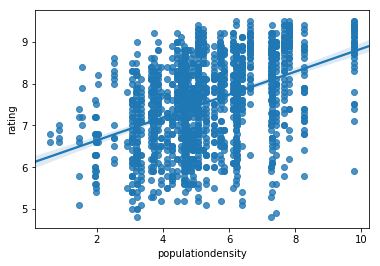

In [19]:
sns.regplot(x = np.log(county_and_restaurant_data['populationdensity']),
           y = county_and_restaurant_data['rating'])

In [20]:
reg_mod = LinearRegression()
X = np.log(county_and_restaurant_data[['populationdensity']])
y = county_and_restaurant_data[['rating']]

In [21]:
imp = Imputer()
X_imp = imp.fit_transform(X)
y_imp = imp.fit_transform(y)

In [22]:
model = reg_mod.fit(X_imp,y_imp)

/Users/joshuaderenski/Library/Python/3.6/lib/python/site-packages/scipy/linalg/basic.py:1226: RuntimeWarning: internal gelsd driver lwork query error, required iwork dimension not returned. This is likely the result of LAPACK bug 0038, fixed in LAPACK 3.2.2 (released July 21, 2010). Falling back to 'gelss' driver.
  warnings.warn(mesg, RuntimeWarning)


In [23]:
unique_counties_and_densities = county_and_restaurant_data[['county','populationdensity']].drop_duplicates()

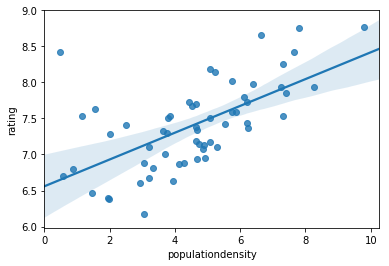

In [24]:
sns.regplot(x = np.log(unique_counties_and_densities['populationdensity']), y =imputed_mean_ratings)

In [25]:
price_gradings = []


for i in range(county_and_restaurant_data.shape[0]):
    
    try:

        price_gradings.append(ast.literal_eval(county_and_restaurant_data['price'][i])['message'])
    except: 
        
        price_gradings.append(None)
            
                

In [26]:
county_and_restaurant_data = county_and_restaurant_data.assign(price_grade = price_gradings)

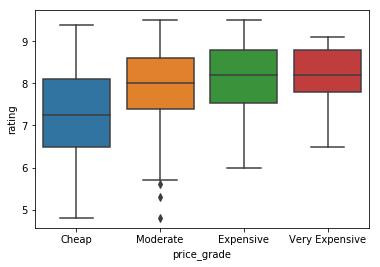

In [27]:
sns.boxplot(x = 'price_grade',y = 'rating', data = county_and_restaurant_data,
           order = ['Cheap','Moderate','Expensive','Very Expensive'])

# Spatial Visualizations

In [28]:
current_variable = 'countywide_average_rating'

california_center = [37.5, -119.4179]


california_map = folium.Map(location=california_center, zoom_start=5.5)



data_for_choropleth = dict(zip(list(county_and_restaurant_data['county']), 
         list(county_and_restaurant_data[current_variable])))



colormap = linear.YlOrRd_09.scale(
    min(list(county_and_restaurant_data[current_variable]))-.5,
    max(list(county_and_restaurant_data[current_variable]))+.5)


# folium.GeoJson(california_geo).add_to(california_map)




color_dict = {key: colormap(data_for_choropleth[key]) for key in data_for_choropleth.keys()}




folium.GeoJson(
    california_geo,
    style_function=lambda feature: {
        'fillColor': color_dict[feature['properties']['name']],
        'color': 'black',
       'weight': 2,
        'fillOpacity': 0.9,
        'dashArray': '1, 1'
    }
).add_to(california_map)

folium.LayerControl().add_to(california_map)

colormap.caption = 'Average Rating'
colormap.add_to(california_map)   

#m.save(os.path.join('results', 'GeoJSON_and_choropleth_5.html'))

california_map


In [29]:
data_for_choropleth = county_and_restaurant_data[['county','D-R spread',
                                                           'centroid_latitude',
                                                           'centroid_longitude']].drop_duplicates()

data_for_choropleth['D-R spread'].min()


-24.1

In [30]:
current_variable = 'D-R spread'

california_center = [37.5, -119.4179]


california_map = folium.Map(location=california_center, zoom_start=5.5)



data_for_choropleth = dict(zip(list(county_and_restaurant_data['county']), 
         list(county_and_restaurant_data[current_variable])))


data_for_choropleth = county_and_restaurant_data[['county',current_variable,
                                                           'centroid_latitude',
                                                           'centroid_longitude']].drop_duplicates()

data_for_choropleth = dict(zip(list(data_for_choropleth['county']), list(data_for_choropleth['D-R spread'])))

california_center = [37.5, -119.4179]

california_map = folium.Map(location=california_center, zoom_start=5.5)





colormap = linear.RdBu_09.scale(
    county_and_restaurant_data[current_variable].min(),
    county_and_restaurant_data[current_variable].max()-23)


color_dict = {key: colormap(data_for_choropleth[key]) for key in data_for_choropleth.keys()}


folium.GeoJson(
    california_geo,
    style_function=lambda feature: {
        'fillColor': color_dict[feature['properties']['name']],
        'color': 'black',
        'weight': 2,
        'fillOpacity': 0.9,
        'dashArray': '1, 1'
    }
).add_to(california_map)

folium.LayerControl().add_to(california_map)

# m.save(os.path.join('results', 'GeoJSON_and_choropleth_5.html'))

california_map


    
colormap.caption = 'Political Registration'
colormap.add_to(california_map)    
    
california_map



In [31]:
california_center = [37.5, -119.4179]


california_map = folium.Map(location=california_center, zoom_start=5.5)

for lat, lng, borough, neighborhood in zip(county_and_restaurant_data['lat'], county_and_restaurant_data['lng'], 
                                           county_and_restaurant_data['county'], 
                                           county_and_restaurant_data['city']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7).add_to(california_map)  
    
california_map

In [33]:
county_and_density = county_and_restaurant_data[['county','populationdensity']].drop_duplicates().reset_index()

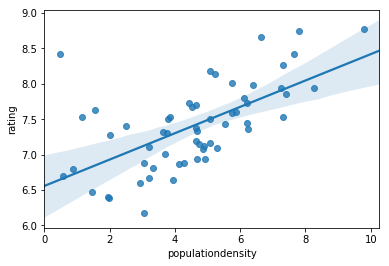

In [34]:
sns.regplot(x = np.log(unique_counties_and_densities['populationdensity']), y =imputed_mean_ratings)

[Text(0,0.5,'Log of Uniqueness Score'),
 Text(0.5,0,'Log of Population Density')]

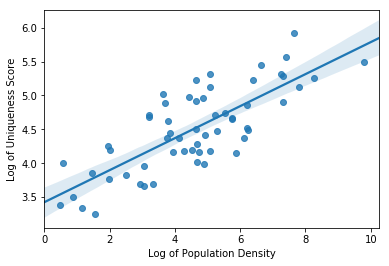

In [35]:
ax = sns.regplot(x=np.log(county_and_density['populationdensity']), y = np.log(uniqueness_scores))

ax.set(xlabel = "Log of Population Density", ylabel = "Log of Uniqueness Score")

In [36]:
num_per_county = county_and_restaurant_data['county'].value_counts().sort_index()

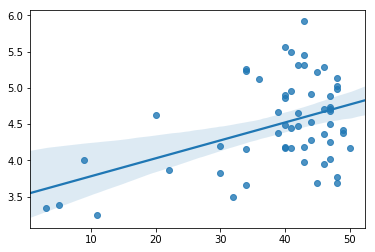

In [37]:
sns.regplot(x=list(num_per_county), y = np.log(uniqueness_scores))

In [38]:
county_and_restaurant_data.columns

Index(['county', 'restaurant', 'id', 'lat', 'lng', 'city', 'category name',
       'category plural name', 'category short name', 'price', 'rating',
       'population', 'populationdensity', 'Per capita income',
       'Median household income', 'Median family income', 'Registered voters',
       'Democratic', 'Republican', 'D-R spread', 'Other',
       'No party preference', 'FIPS', 'County Seat', 'Land Area (km2)',
       'Land Area (mi2)', 'Water Area (km2)', 'Water Area (mi2)',
       'Total Area (km2)', 'Total Area (mi2)', 'centroid_latitude',
       'centroid_longitude', 'price_grade', 'uniqueness', 'diversity',
       'countywide_average_rating'],
      dtype='object')

In [39]:
current_variable = 'uniqueness'

california_center = [37.5, -119.4179]


california_map = folium.Map(location=california_center, zoom_start=5.5)



data_for_choropleth = dict(zip(list(county_and_restaurant_data['county']), 
         list(county_and_restaurant_data[current_variable])))



colormap = linear.YlOrRd_09.scale(
    min(list(county_and_restaurant_data[current_variable]))-.5,
    max(list(county_and_restaurant_data[current_variable]))+.5)





# folium.GeoJson(california_geo).add_to(california_map)




color_dict = {key: colormap(data_for_choropleth[key]) for key in data_for_choropleth.keys()}




folium.GeoJson(
    california_geo,
    style_function=lambda feature: {
        'fillColor': color_dict[feature['properties']['name']],
        'color': 'black',
        'weight': 2,
        'fillOpacity': 0.9,
        'dashArray': '1, 1'
    }
).add_to(california_map)

folium.LayerControl().add_to(california_map)

colormap.caption = 'Uniqueness Score'
colormap.add_to(california_map)   

# m.save(os.path.join('results', 'GeoJSON_and_choropleth_5.html'))

california_map

In [40]:
current_variable = 'diversity'

california_center = [37.5, -119.4179]


california_map = folium.Map(location=california_center, zoom_start=5.5)



data_for_choropleth = dict(zip(list(county_and_restaurant_data['county']), 
         list(county_and_restaurant_data[current_variable])))



colormap = linear.YlOrRd_09.scale(
    min(list(county_and_restaurant_data[current_variable])),
    max(list(county_and_restaurant_data[current_variable])))






# folium.GeoJson(california_geo).add_to(california_map)




color_dict = {key: colormap(data_for_choropleth[key]) for key in data_for_choropleth.keys()}




folium.GeoJson(
    california_geo,
    style_function=lambda feature: {
        'fillColor': color_dict[feature['properties']['name']],
        'color': 'black',
        'weight': 2,
        'fillOpacity': 0.9,
        'dashArray': '1, 1'
    }
).add_to(california_map)

folium.LayerControl().add_to(california_map)

colormap.caption = 'Diversity Score'
colormap.add_to(california_map)   

# m.save(os.path.join('results', 'GeoJSON_and_choropleth_5.html'))

california_map

In [41]:
data_for_choropleth['San Luis Obispo']

0.44672451208603026

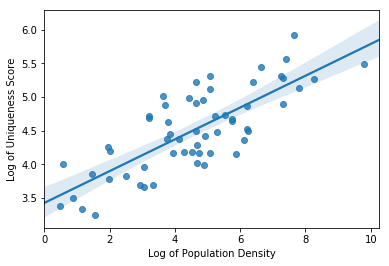

In [64]:
x = 'populationdensity'
y = 'uniqueness'

density_and_uniqueness = county_and_restaurant_data.loc[:,[x,y]].drop_duplicates()



ax = sns.regplot(x=np.log(density_and_uniqueness[x]), 
                 y = np.log(density_and_uniqueness[y]))

ax.set(xlabel = "Log of Population Density", ylabel = "Log of Uniqueness Score")

# ax = sns.regplot(x=diversity , y = np.log(uniqueness_scores))


ax.figure.savefig("density_and_uniqueness.png", bbox_inches='tight')


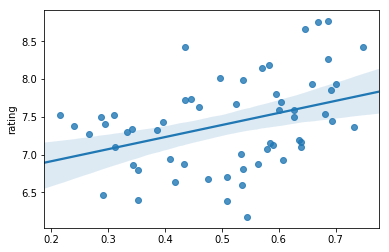

In [43]:
ax = sns.regplot(x=diversity, y = imputed_mean_ratings)

# Modeling

In [44]:
data_for_model = (county_and_restaurant_data[['populationdensity','D-R spread',
                                              'countywide_average_rating']]
                  .drop_duplicates().reset_index()
                 )
data_for_model
X_dict = {'log_density': np.log(data_for_model['populationdensity'])}

design_matrix = pd.DataFrame(X_dict)

y = data_for_model[['countywide_average_rating']]
imp = Imputer()
X_imp = imp.fit_transform(design_matrix)
y_imp =imp.fit_transform(y)
X2 = sm.add_constant(X_imp)
est = sm.OLS(y_imp, X2)
est2 = est.fit()
print(est2.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.390
Model:                            OLS   Adj. R-squared:                  0.379
Method:                 Least Squares   F-statistic:                     35.82
Date:                Thu, 08 Nov 2018   Prob (F-statistic):           1.61e-07
Time:                        11:19:33   Log-Likelihood:                -38.255
No. Observations:                  58   AIC:                             80.51
Df Residuals:                      56   BIC:                             84.63
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          6.5577      0.155     42.177      0.0

In [45]:
X2.shape

(58, 2)

In [46]:
county_and_restaurant_data.shape

(2280, 36)